In [23]:
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow
import numpy as np
import os

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


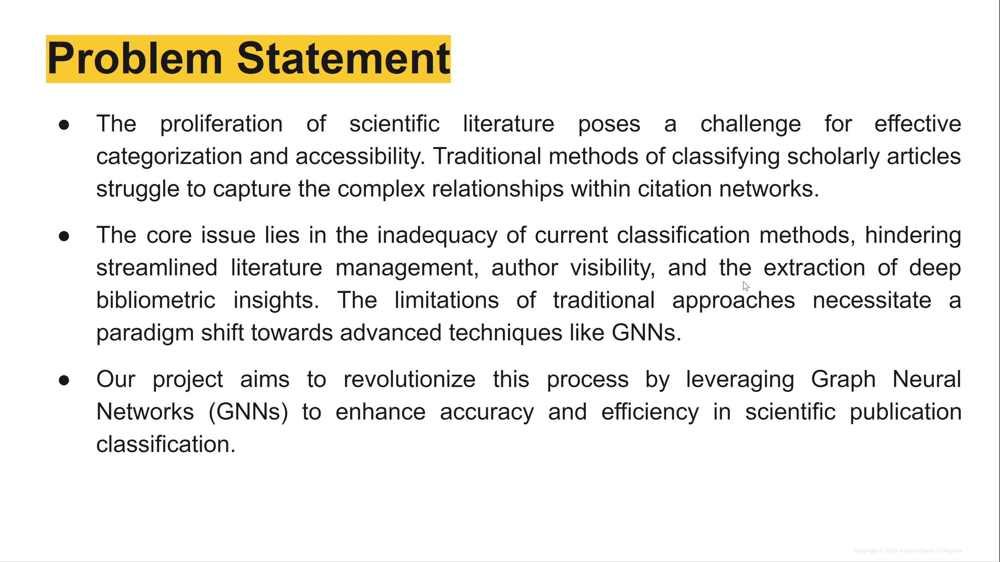

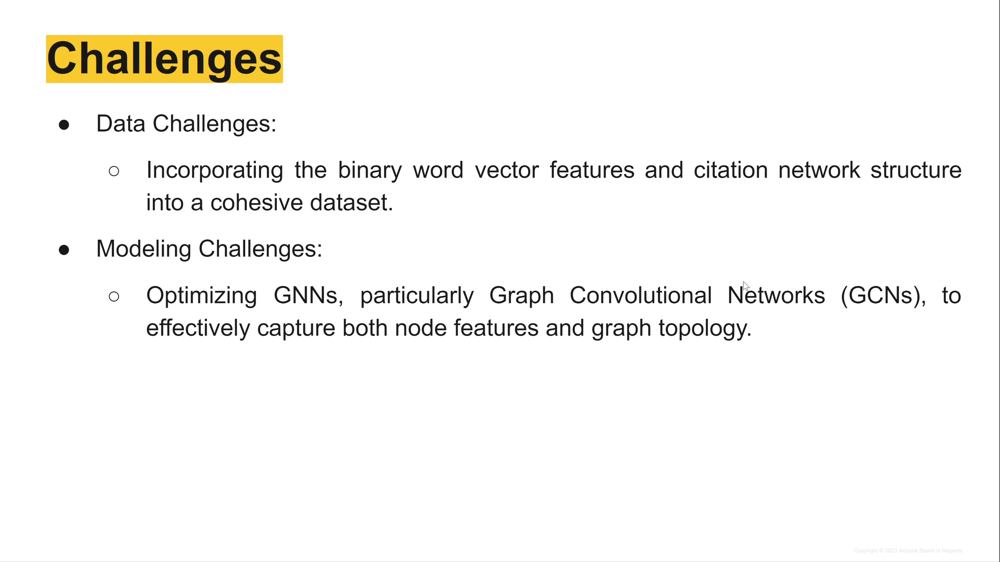

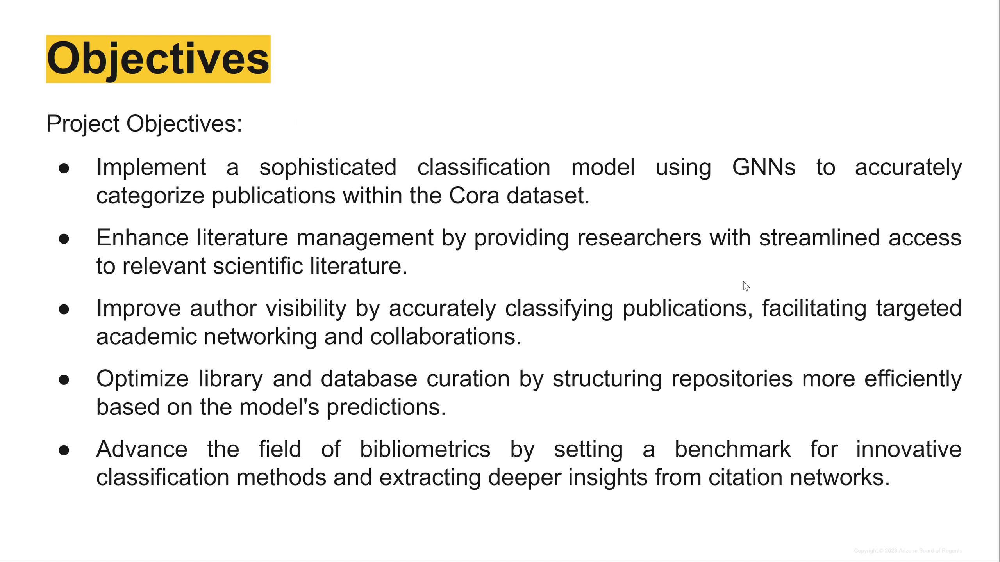

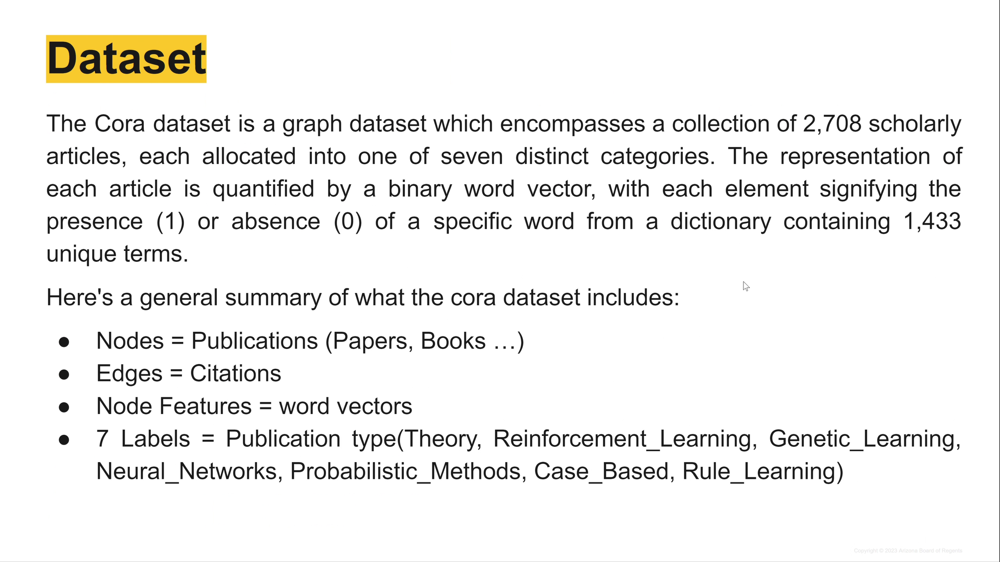

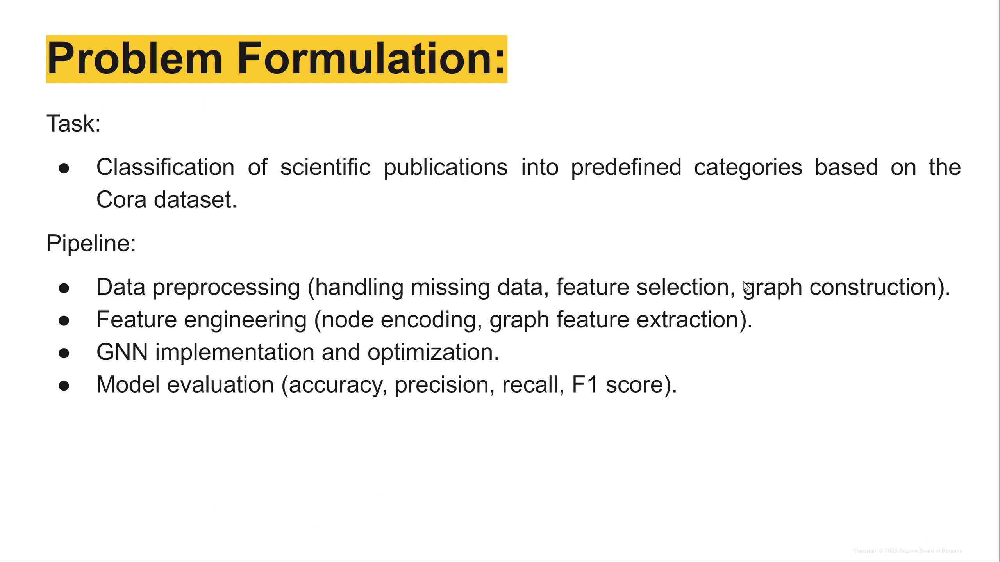

...

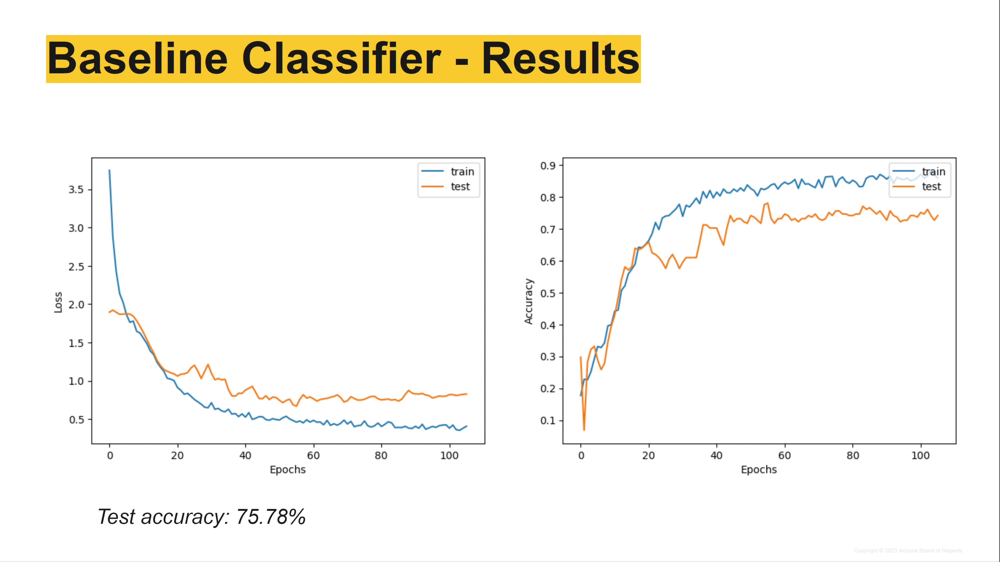

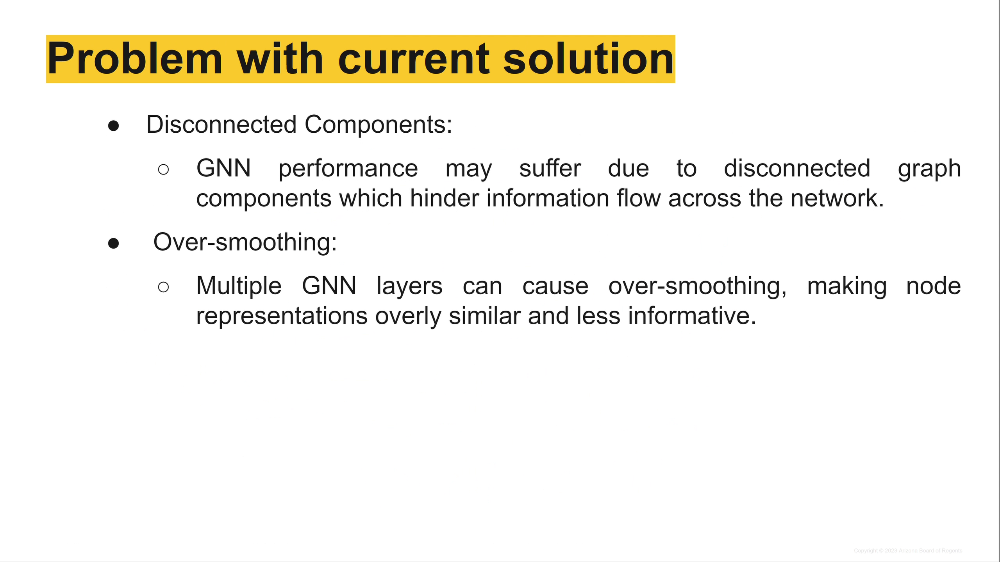

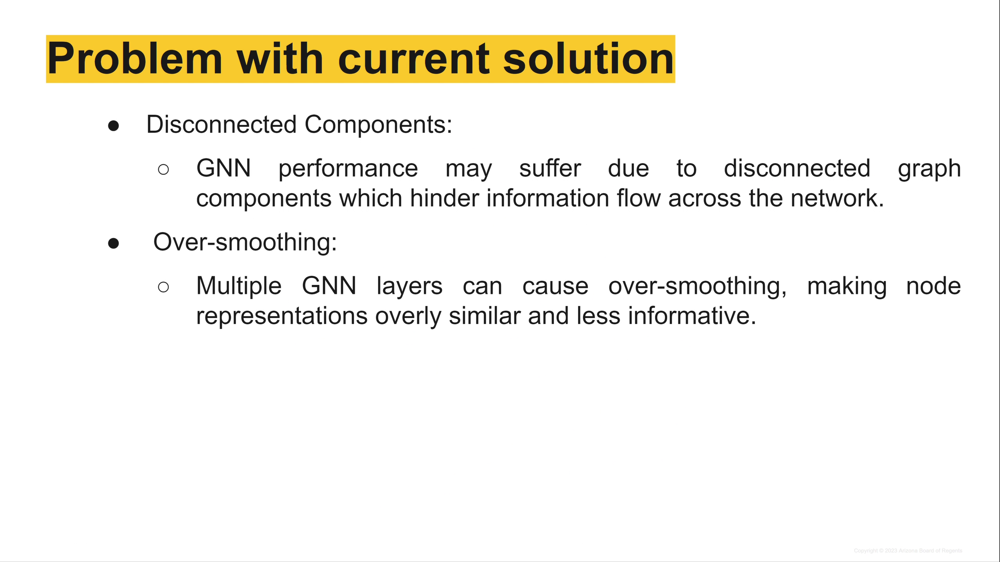

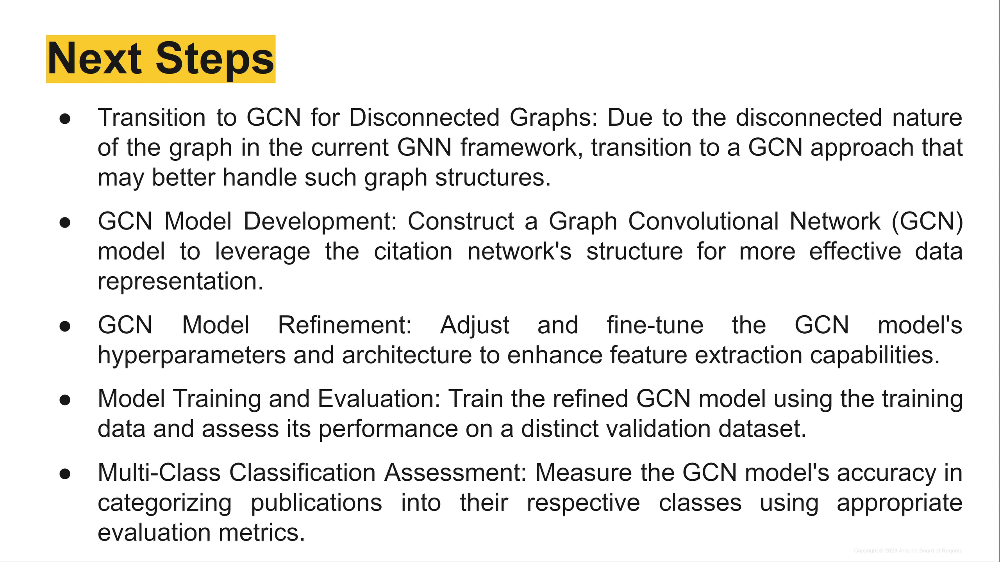

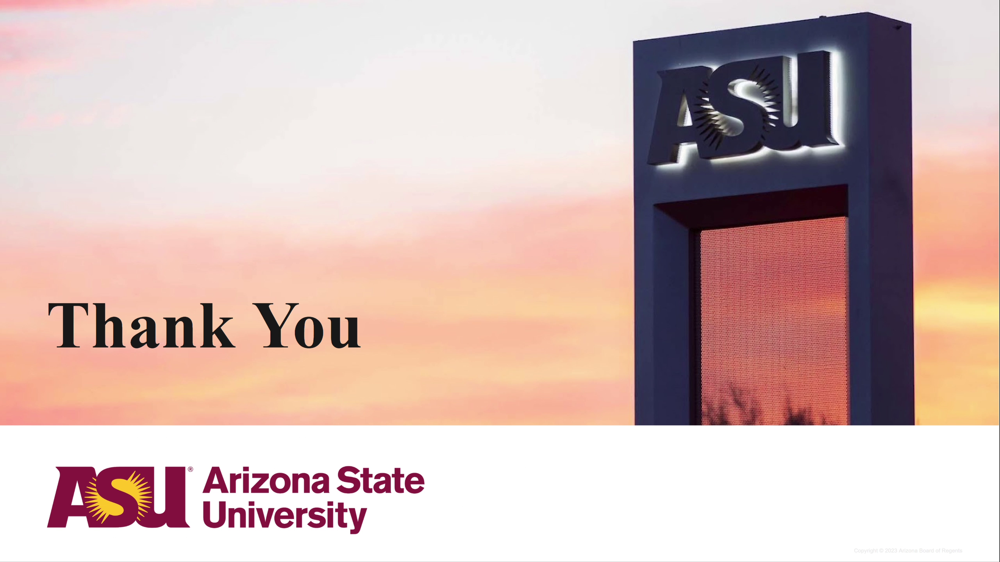

Potential shot boundary frames: [157, 169, 179, 187, 201, 230, 246, 260, 272, 286, 302, 321, 342, 355, 371, 385, 395, 397, 405, 419]


In [24]:
'''
I am doing shot boundary detection using histogram differences which involves comparing the histograms of consecutive frames in a video.
When a significant change occurs between two consecutive frames, it results in a notable difference in their histograms.
By calculating and analyzing these differences, potential shot boundaries can be identified, allowing for the segmentation of the video into distinct clips or scenes.
I have given the sample video of my presentation which consisted of 21 slides and the algorithm gave potential shot boundry fames to be 20 which is quite accurate.
'''
drive.mount('/content/drive')

# Path to the video file on Google Drive
video_path = '/content/drive/My Drive/sample1.mp4'

# Parameters for shot boundary detection
threshold = 7000  # this threshold value can be chnaged
hist_diff_list = []
shot_boundaries = []

# Loading the video
cap = cv2.VideoCapture(video_path)

# Reading the first frame
ret, prev_frame = cap.read()
prev_frame_gray = cv2.cvtColor(prev_frame, cv2.COLOR_BGR2GRAY)

# Processing subsequent frames
num_frames_processed = 0
while(cap.isOpened()):
    ret, frame = cap.read()
    if not ret:
        break

    num_frames_processed += 1

    frame_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Calculating histogram differences between consecutive frames
    hist_diff = cv2.compareHist(cv2.calcHist([frame_gray], [0], None, [256], [0,256]),
                                 cv2.calcHist([prev_frame_gray], [0], None, [256], [0,256]),
                                 cv2.HISTCMP_CHISQR)

    # Storing histogram difference in the list
    hist_diff_list.append(hist_diff)

    # Checking if shot boundary is detected
    if hist_diff > threshold:
        shot_boundaries.append(num_frames_processed)

        # Saving the frames
        frame_name = f'frame_{num_frames_processed}.jpg'
        frame_path = os.path.join('/content/', frame_name)
        cv2.imwrite(frame_path, frame)

        # Displaying the potential frame
        cv2_imshow(frame)
        cv2.waitKey(0)

    prev_frame_gray = frame_gray

cap.release()

print("Potential shot boundary frames:", shot_boundaries)



